In [1]:
#Imported applicable panda libraries
import pandas as pd
from pathlib import Path
import hvplot.pandas
import numpy as np
import requests
import requests_html
import ftplib
import io
from yahoo_fin.stock_info import get_data
import yahoo_fin.stock_info as si
from IPython.display import display_html
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from dotenv import load_dotenv
import os
import plotly.express as px
import panel as pn
pn.extension('plotly')

In [2]:
#Created a for loop to get historical data for listed price in ticker_list utilzing get_data function from yahoo_fin.stock_info API.
s1= "incy"
s2= "mrk"
s3 = "pfe"
s4 = "unh"
s5= "zbh"

ticker_list = [s1,s2,s3,s4,s5]
historical_data = {}
for ticker in ticker_list:
    historical_data[ticker] = get_data(ticker)


In [3]:
#created variables to parse historical close prices for individuals stocks
ticker_1 = historical_data[s1]["close"]
ticker_2 = historical_data[s2]["close"]
ticker_3 = historical_data[s3]["close"]
ticker_4 = historical_data[s4]["close"]
ticker_5 = historical_data[s5]["close"]


In [4]:
#created finance_stocks_close_df that concatenated the individual stocks closing prices into one data frame
finance_stocks_close_df = pd.concat([ticker_1,ticker_2,ticker_3,ticker_4,ticker_5],axis=1,keys=[s1,s2,s3,s4,s5])
display(finance_stocks_close_df.head())
display(finance_stocks_close_df.tail())

,incy,mrk,pfe,unh,zbh
1970-03-25,NaN,1.378287,NaN,NaN,NaN
1970-03-26,NaN,1.378287,NaN,NaN,NaN
1970-03-30,NaN,1.373317,NaN,NaN,NaN
1970-03-31,NaN,1.351781,NaN,NaN,NaN
1970-04-01,NaN,1.355094,NaN,NaN,NaN


,incy,mrk,pfe,unh,zbh
2022-05-09,72.650002,87.639999,48.639999,486.420013,115.000000
2022-05-10,76.139999,87.809998,49.490002,488.010010,114.169998
2022-05-11,73.910004,89.190002,49.450001,486.149994,113.419998
2022-05-12,75.510002,90.830002,50.389999,478.799988,113.099998
2022-05-13,74.900002,90.410004,49.919998,485.399994,115.070000


In [5]:
#Code used to confirm start dates of the finance_stocks_close_df above
historical_data[s2].head(2)

,open,high,low,close,adjclose,volume,ticker
1970-03-25,1.348468,1.398166,1.348468,1.378287,0.296298,1139386,MRK
1970-03-26,1.378287,1.383256,1.368347,1.378287,0.296298,1101658,MRK


In [6]:
#describe() function used to get the statistial summary for the the listed stock tickers
finance_stocks_close_df.describe()

,incy,mrk,pfe,unh,zbh
count,7183.000000,13153.000000,12598.000000,9471.000000,5235.000000
mean,34.153512,29.484824,16.191033,65.688506,83.570105
std,36.240796,25.776259,14.834211,103.847429,33.160319
min,1.718750,0.982361,0.427439,0.085938,24.291262
25%,7.160000,2.382183,1.606603,4.617188,58.713593
50%,15.671875,26.087786,13.776486,23.309999,76.844658
75%,66.885002,51.307251,30.245493,58.945000,111.805828
max,152.660004,90.830002,61.250000,546.010010,173.407761


In [7]:
#daily_returns_finance_stocks variable created to computes daily returns for each individual ticker 
daily_returns_finance_stocks = finance_stocks_close_df.pct_change().dropna()
daily_returns_finance_stocks.head()

,incy,mrk,pfe,unh,zbh
2001-07-26,0.087788,-0.003539,-0.002743,0.008532,-0.055780
2001-07-27,0.012933,0.005868,-0.003751,-0.000154,0.010676
2001-07-30,-0.007150,0.017040,0.006526,0.023846,0.002113
2001-07-31,-0.031379,0.026113,0.027930,0.013073,0.004919
2001-08-01,-0.005842,0.000147,-0.001941,-0.035894,0.031469


In [8]:
#finance_cum_ret variable created that computes the cumulative returns for each individual ticker and used to plot returns for comparison.
finance_cum_ret = (1 + daily_returns_finance_stocks).cumprod() -1
display(finance_cum_ret.hvplot(legend=True,figsize=(10,7),title="Cumulative Returns",xlabel="Year",ylabel="Returns"))

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [9]:
#historical_cum_ret variable created that computes the cumulative returns for each individual ticker and used to plot returns for comparison, but without dropping null values so as to show lifetime figures vs only data since all stocks traded.
historical_returns_finance_stocks = finance_stocks_close_df.pct_change()
historical_cum_ret = (1 + historical_returns_finance_stocks).cumprod() -1
display(historical_cum_ret.hvplot(legend=True,figsize=(10,7),title="Historical Cumulative Returns",xlabel="Year",ylabel="Returns"))

:NdOverlay   [Variable]
   :Curve   [index]   (value)

:Bars   [index]   (0)

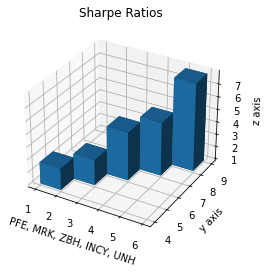

None

In [10]:
# variables created for annualized standard deviation and annualized returns for the individual tickers utilizing 252 trading days to compute and plot the Sharpe Ratios (Return/Risk ratio)
trading_year = 252
annualized_std = daily_returns_finance_stocks.std() * np.sqrt(trading_year)
annualized_returns = daily_returns_finance_stocks.mean() * trading_year
sharpe = annualized_returns/annualized_std
#created a 3d plot to display the Sharpe Ratio is ascending order for tickers
fig = plt.figure()
ax1 =fig.add_subplot(111,projection="3d")
x3 = [1,2,3,4,5]
y3 = [4,5,6,7,8]
z3 = np.ones(5)

dx = np.ones(5)
dy = np.ones(5)
dz = [1.7,2,3.8,4.2,6.9]

ax1.bar3d(x3,y3,z3,dx,dy,dz)

ax1.set_xlabel("PFE, MRK, ZBH, INCY, UNH")
ax1.set_ylabel("y axis")
ax1.set_zlabel("z axis")
ax1.set_title("Sharpe Ratios")



display(sharpe.hvplot(kind="bar",figsize=(10,7),title="Sharpe Ratios")) 
display(plt.show())

In [11]:
#Analyst to recommend 2 tickers to provide to user from selected industry sector based on Sharpe Ratio and cumulative returns comparison above.
#Utilizing the get_stats_valuation function from the yahoo_fin.stock_info library to get selected tickers current valuation stats. This section is used to compare selected tickers
#trailing P/E and Forward P/E ratios for ticker recommendation (Fundamental Analysis).
stock_1 = s4
stock_2 = s1

stock_selection1 = si.get_stats_valuation(stock_1).style.set_table_attributes("style='display:inline'").set_caption(stock_1)
stock_selection2 = si.get_stats_valuation(stock_2).style.set_table_attributes("style='display:inline'").set_caption(stock_2)

display_html(stock_selection1._repr_html_()+stock_selection2._repr_html_(), raw=True)

,Unnamed: 0,As of Date: 5/13/2022Current,3/31/2022,12/31/2021,9/30/2021,6/30/2021,3/31/2021
0,Market Cap (intraday),449.20B,478.86B,472.51B,368.08B,377.61B,351.23B
1,Enterprise Value,468.29B,500.96B,495.61B,393.73B,400.96B,374.92B
2,Trailing P/E,26.21,28.21,31.15,25.79,22.77,23.21
3,Forward P/E,22.17,23.64,23.26,18.15,21.88,20.49
4,PEG Ratio (5 yr expected),1.74,1.85,1.84,1.44,1.71,1.60
5,Price/Sales (ttm),1.55,1.71,1.73,1.39,1.47,1.40
6,Price/Book (mrq),6.17,6.67,6.72,5.33,5.69,5.36
7,Enterprise Value/Revenue,1.59,6.28,6.80,5.48,5.67,5.38
8,Enterprise Value/EBITDA,17.14,64.74,78.52,60.50,59.35,50.01
,Unnamed: 0,As of Date: 5/12/2022Current,3/31/2022,12/31/2021,9/30/2021,6/30/2021,3/31/2021


In [12]:
#Listing 52 week high/low of ticker to current ticker price (technical analysis) for determining breakouts opportunites for ticker and support and resistance areas for purchase or sells.
input= stock_1
ticker_52_wk_high_low = si.get_stats(input)[3:5]
display(input)
display(ticker_52_wk_high_low)
print(f"Most recent price for: {si.get_live_price(input): .02f}")

'unh'

,Attribute,Value
3,52 Week High 3,553.29
4,52 Week Low 3,383.12


Most recent price for:  485.40


In [13]:
#Utilizing the get_stats function from the yahoo_fin.stock_info library to get selected tickers current financial stats. This section is used to compare selected tickers
# financial stats (Fundamental Analysis).


stock_selection1 = si.get_stats(stock_1).style.set_table_attributes("style='display:inline'").set_caption(stock_1)
stock_selection2 = si.get_stats(stock_2).style.set_table_attributes("style='display:inline'").set_caption(stock_2)

display_html(stock_selection1._repr_html_()+stock_selection2._repr_html_(), raw=True)

,Attribute,Value
0,Beta (5Y Monthly),0.88
1,52-Week Change 3,16.84%
2,S&P500 52-Week Change 3,-5.84%
3,52 Week High 3,553.29
4,52 Week Low 3,383.12
5,50-Day Moving Average 3,510.02
6,200-Day Moving Average 3,462.64
7,Avg Vol (3 month) 3,3.2M
8,Avg Vol (10 day) 3,3.55M
9,Shares Outstanding 5,938.17M


In [14]:
### Panel Visualization Functions

In [15]:
# Define Panel visualization functions
def create_bar_chart(data, title, xlabel, ylabel, color):
    """
    Create a barplot based in the data argument.
    """
    
    fig = plt.figure(figsize=(6, 5))
    bar_chart = data.plot.bar(color=color)
    bar_chart.set_xlabel(xlabel, fontsize=12)
    bar_chart.set_ylabel(ylabel, fontsize=12)
    bar_chart.set_title(title, fontsize=14, fontweight="bold")
    plt.close(fig)
    
    return pn.pane.Matplotlib(fig, tight=True)

def create_3d_bar_chart(data, title, xlabel, ylabel, zlabel, color):
    """
    Create a 3D barplot based in the data argument.
    """
    
    fig = plt.figure(figsize=(6, 5))
    ax1 = fig.add_subplot(111,projection="3d")
    x3 = [1,2,3,4,5]
    y3 = [4,5,6,7,8]
    z3 = np.ones(5)

    dx = np.ones(5)
    dy = np.ones(5)
    dz = [1.7,2,3.8,4.2,6.9]

    ax1.bar3d(x3,y3,z3,dx,dy,dz)
    ax1.set_xlabel(xlabel, fontsize=12)
    ax1.set_ylabel(ylabel, fontsize=12)
    ax1.set_zlabel(zlabel, fontsize=12)
    ax1.set_title(title, fontsize=14, fontweight="bold")
    plt.close(fig)
    
    return pn.pane.Matplotlib(fig, tight=True)

def create_line_chart(data, title, xlabel, ylabel):
    """
    Create a line chart based in the data argument.
    """
    fig = data.hvplot(legend=True,figsize=(10,7),title=title,xlabel=xlabel,ylabel=ylabel)
    
    return fig

def high_low(input):
    """
    Highlight 52 Week data for contextual understanding
    """
    ticker_52_wk_high_low = si.get_stats(input)[3:5]
    ticker_52_wk_high_low['Recent Price'] = round(si.get_live_price(input), 2)
    ticker_52_wk_high_low['Symbol'] = str(input)
    return  ticker_52_wk_high_low

def get_data(ticker):
    """
    Important financial data for contextual analysis
    """

    stock_selection = si.get_stats(ticker).style.set_table_attributes("style='display:inline'").set_caption(ticker)
    
    return stock_selection

In [16]:
### Panel Dashboard

In [17]:
# Create a Title for the Dashboard
title = pn.pane.Markdown(
    """
# Health Sector Stock Analysis
""",
    width=1800,
)

# Define a welcome text
welcome = pn.pane.Markdown(
    """
This dashboard presents a visual analysis of historical stock market values for a selection of high performing health candidates for potential investment. You can navigate through the tabs above
to explore more details about the historical performance of the companies in question, or skip to the final tab for our recommendations for selection to add to your own trading portfolio.
""",
    width=1024,
)
jpg_pane1 = pn.pane.JPG('https://www.investors.com/wp-content/uploads/2016/08/stock-bull-9-adobe.jpg', width=500)

# Define a recommendation text
jpg_pane2 = pn.pane.JPG('https://www.scoopearth.com/wp-content/uploads/2022/04/5-Best-Stocks-to-Buy-Now-and-Hold-for-the-Next-10-Years.jpg', width=500)
summary = pn.pane.Markdown(
    """
Based upon the data we have collected and analyzed for your benefeit, it is our recommendation that you should consider purchasing stock positions in either UNH ('UnitedHealth Group') or INCY ('Incyte Group').
The primary differentiator for the purposes of selecting the best stock is the Sharpe Ratio, which takes into account both risk and return potential in the companies.
""",
    width=1024,
)




# Create a tab layout for the dashboard
tabs = pn.Tabs(
    # First tab
    (
        "Welcome",
        pn.Column(
            welcome,
            jpg_pane1

        ),
    ),
    # Second tab
    (
        "Sharpe Ratios",
        pn.Column(
                    create_bar_chart(
                        sharpe,
                        "Sharpe Ratios",
                        "Company Stock Tickers",
                        "Beta Values",
                        "red"
                    ),
                ),
    ),
    # Third Tab
    (
        "3D Sharpe Ratios",
            pn.Column(
                create_3d_bar_chart(
                sharpe,
                "Sharpe Ratios",
                "PFE, MRK, ZBH, INCY, UNH",
                "Y Axis",
                "Z Axis",
                "blue"
                ),
            ),
    ),
    # Fourth tab
    (
        "Charted Historical Returns",
            pn.Column(
                create_line_chart(
                historical_cum_ret,
                "Historical Cumulative Returns",
                "Years",
                "Total Returns"
                ),
            ),
    ),
     # Fifth tab
    (
        "52 Week Data",
        pn.Column(
            pn.Row(
                high_low(
                stock_1
                ),
                high_low(
                stock_2
                ),
            ),
        ),
    ),
     # Sixth tab
    (
        "In-Depth Financial Data",
        pn.Column(
            pn.Row(
                get_data(
                stock_1
                ),
                get_data(
                stock_2
                ),
            ),
        ),
    ),
    # Final tab
    (
        "Recommendations",
        pn.Column(
            summary,
            jpg_pane2
        ),
    ),
)

get_data(ticker)

# Create the main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width=1024,
    height=768
)

In [18]:
## Serve the Panel Dashboard

Column(height=768, sizing_mode='fixed', width=1024)
    [0] Row
        [0] Markdown(str, width=1800)
    [1] Tabs
        [0] Column
            [0] Markdown(str, width=1024)
            [1] JPG(str, width=500)
        [1] Column
            [0] Matplotlib(Figure, tight=True)
        [2] Column
            [0] Matplotlib(Figure, tight=True)
        [3] Column
            [0] HoloViews(NdOverlay)
        [4] Column
            [0] Row
                [0] DataFrame(DataFrame)
                [1] DataFrame(DataFrame)
        [5] Column
            [0] Row
                [0] DataFrame(Styler)
                [1] DataFrame(Styler)
        [6] Column
            [0] Markdown(str, width=1024)
            [1] JPG(str, width=500)
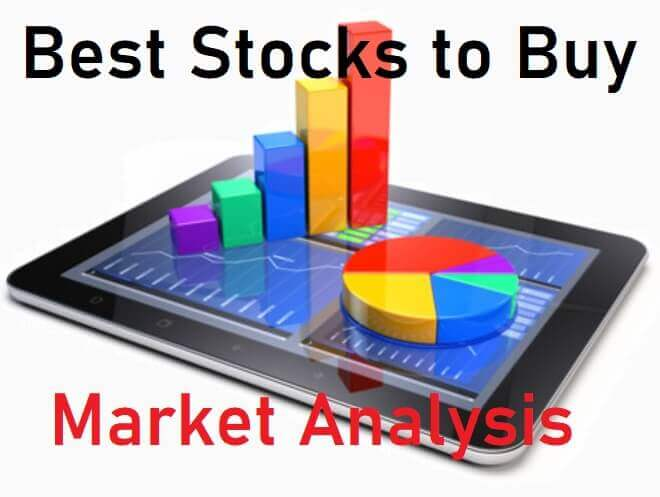
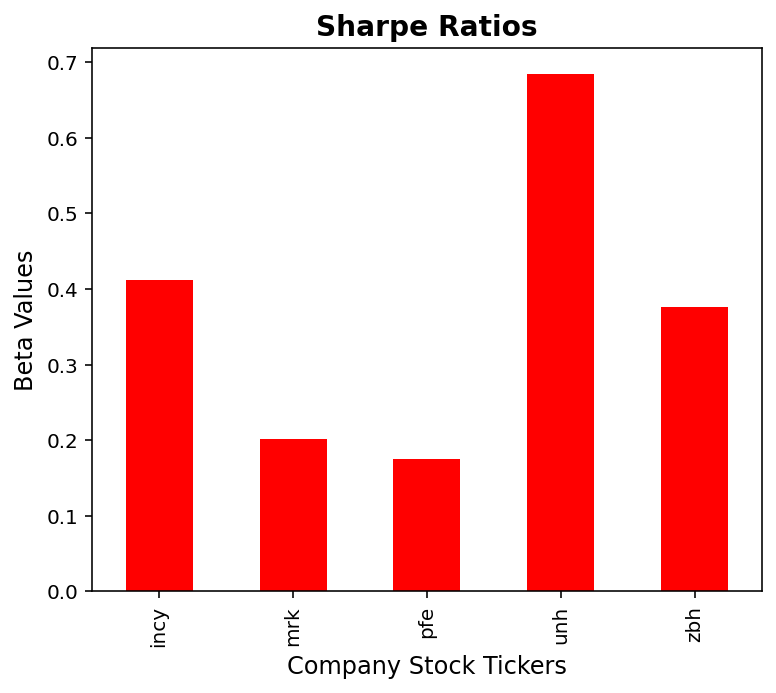
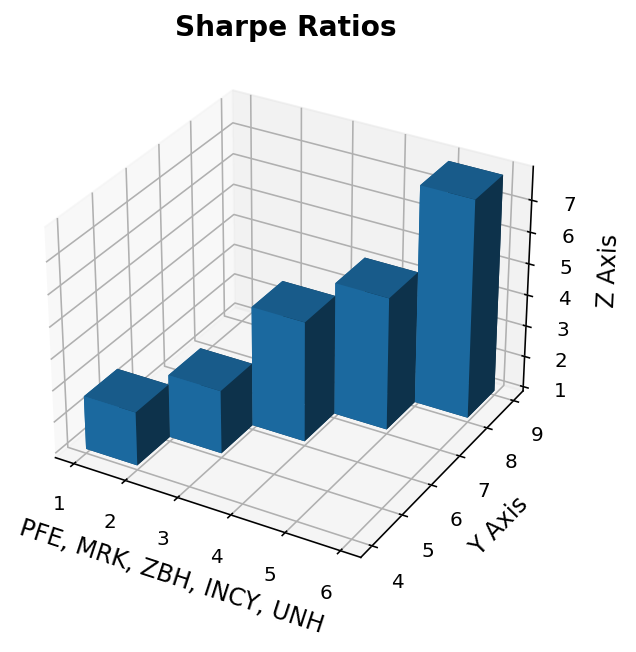
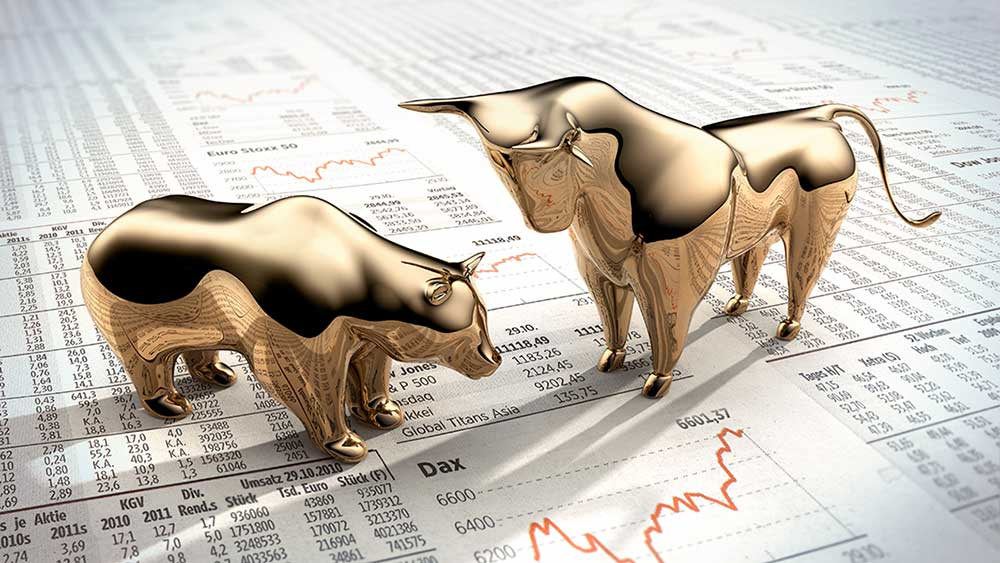

In [19]:
dashboard.servable()